# Capstone Project - Boston Fitness Venues and Neighborhoods 
#### A Jupyter Notebook by William Scott Breckwoldt

## Introduction

In this python notebook, we will be gathering data related to the fitness industry research industry in Boston.  This includes the markers for all the fitness venues, as well as the population, median household income, percentage of population 20 to 34 years old, percentage of population with a bachelor's degree, and median monthly rent for a one bedroom apartment in each of its neighborhoods.  Then, we will be making maps using Folium, Choloropleth, and GeoJson and histograms with MatPlotLib to demonstrate the Boston fitness industry.  Hopefully, our findings will give us some insight into the Boston fitness club industry. 


## Data

First, we will be needing the markers for each of the fitness club venues in Boston and we can do this by using Foursquare.  Then we will export to a .csv and edit or add markers simply by using Google maps.

### Using Foursquare to Search for Venues

In [1]:
import requests # library to handle requests
import pandas as pd # library for data analsysis
import numpy as np # library to handle data in a vectorized manner
import random # library for random number generation


!pip install geopy
from geopy.geocoders import Nominatim # module to convert an address into latitude and longitude values

# libraries for displaying images
from IPython.display import Image 
from IPython.core.display import HTML 
    
# tranforming json file into a pandas dataframe library
from pandas.io.json import json_normalize


! pip install folium==0.11.0
import folium # plotting library

print('Folium installed')
print('Libraries imported.')

Folium installed
Libraries imported.


In [3]:
CLIENT_ID = 'C0SHEUS3TZNS53RVI1WEQQMQGJUIJ1CVPYSTA54RVP1T3LXQ' # your Foursquare ID
CLIENT_SECRET = '1KRDEUYMOSEZX2FLXM1TLTJ3HAJG40U1XQAOCG0UGDXHKRUX' # your Foursquare Secret
ACCESS_TOKEN = 'DR4VOEHRB3NBWSSFJ0NEOYB43MNJ1SVDO1DQCXJ4C3J1C0JU' # your FourSquare Access Token
VERSION = '20180604'
LIMIT = 200
print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: C0SHEUS3TZNS53RVI1WEQQMQGJUIJ1CVPYSTA54RVP1T3LXQ
CLIENT_SECRET:1KRDEUYMOSEZX2FLXM1TLTJ3HAJG40U1XQAOCG0UGDXHKRUX


In [4]:
address = 'Boston, MA'

geolocator = Nominatim(user_agent="foursquare_agent")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print("Boston's coordinates:", latitude, longitude)

Boston's coordinates: 42.3602534 -71.0582912


In [6]:
search_query = 'gym'
radius = 4000
print(search_query + '. . . 100%!')


gym. . . 100%!


In [7]:
url = 'https://api.foursquare.com/v2/venues/search?client_id={}&client_secret={}&ll={},{}&oauth_token={}&v={}&query={}&radius={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET, latitude, longitude,ACCESS_TOKEN, VERSION, search_query, radius, LIMIT)
url

'https://api.foursquare.com/v2/venues/search?client_id=C0SHEUS3TZNS53RVI1WEQQMQGJUIJ1CVPYSTA54RVP1T3LXQ&client_secret=1KRDEUYMOSEZX2FLXM1TLTJ3HAJG40U1XQAOCG0UGDXHKRUX&ll=42.3602534,-71.0582912&oauth_token=DR4VOEHRB3NBWSSFJ0NEOYB43MNJ1SVDO1DQCXJ4C3J1C0JU&v=20180604&query=gym&radius=4000&limit=200'

In [8]:
results = requests.get(url).json()
results

{'meta': {'code': 200, 'requestId': '5ffb4ba5ccdb8b3199e47591'},
 'notifications': [{'type': 'notificationTray', 'item': {'unreadCount': 0}}],
 'response': {'venues': [{'id': '4b45280df964a520870626e3',
    'name': 'Longfellow Gym',
    'location': {'address': '1 Longfellow Pl',
     'crossStreet': 'at Staniford St',
     'lat': 42.36362354228651,
     'lng': -71.0649127666248,
     'labeledLatLngs': [{'label': 'display',
       'lat': 42.36362354228651,
       'lng': -71.0649127666248}],
     'distance': 661,
     'postalCode': '02114',
     'cc': 'US',
     'city': 'Boston',
     'state': 'MA',
     'country': 'United States',
     'formattedAddress': ['1 Longfellow Pl (at Staniford St)',
      'Boston, MA 02114']},
    'categories': [{'id': '4bf58dd8d48988d176941735',
      'name': 'Gym',
      'pluralName': 'Gyms',
      'shortName': 'Gym',
      'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/building/gym_',
       'suffix': '.png'},
      'primary': True}],
    'referr

In [9]:
# assign relevant part of JSON to venues
venues = results['response']['venues']

# tranform venues into a dataframe
dataframe = json_normalize(venues)
dataframe.head()

<ipython-input-9-5acf500bf9ad>:5: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  dataframe = json_normalize(venues)


,id,name,categories,referralId,hasPerk,location.address,location.crossStreet,location.lat,location.lng,location.labeledLatLngs,location.distance,location.postalCode,location.cc,location.city,location.state,location.country,location.formattedAddress
0,4b45280df964a520870626e3,Longfellow Gym,"[{'id': '4bf58dd8d48988d176941735', 'name': 'G...",v-1610304421,False,1 Longfellow Pl,at Staniford St,42.363624,-71.064913,"[{'label': 'display', 'lat': 42.36362354228651...",661,02114,US,Boston,MA,United States,"[1 Longfellow Pl (at Staniford St), Boston, MA..."
1,4fac067ee4b006e8b38d720b,Millenium Gym,"[{'id': '4bf58dd8d48988d176941735', 'name': 'G...",v-1610304421,False,NaN,NaN,42.360110,-71.056470,"[{'label': 'display', 'lat': 42.36011, 'lng': ...",150,02109,US,Boston,MA,United States,"[Boston, MA 02109]"
2,5f0cd0452a2dd62da327a933,The Gym,"[{'id': '4bf58dd8d48988d175941735', 'name': 'G...",v-1610304421,False,50 Causeway St,NaN,42.365479,-71.062430,"[{'label': 'display', 'lat': 42.365479, 'lng':...",673,02114,US,Boston,MA,United States,"[50 Causeway St, Boston, MA 02114]"
3,51dc3c10498e39f044e56ddc,Gym at 73 Tremont,"[{'id': '4bf58dd8d48988d176941735', 'name': 'G...",v-1610304421,False,NaN,NaN,42.357843,-71.061184,"[{'label': 'display', 'lat': 42.35784312015684...",358,NaN,US,Boston,MA,United States,"[Boston, MA]"
4,4ca47bebb0ff8cfa28dfbf5e,Union Gym,"[{'id': '4bf58dd8d48988d176941735', 'name': 'G...",v-1610304421,False,48 Boylston St,at Tremont,42.352093,-71.063929,"[{'label': 'display', 'lat': 42.35209270261844...",1019,02116,US,Boston,MA,United States,"[48 Boylston St (at Tremont), Boston, MA 02116]"


#### Cleaning the Foursquare Data

We have some useful raw data here, however, a lot of these points look like hotel gyms/fitness centers.  We will have to clean the data and keep in mind what we may be needing to add to the dataset.

In [10]:
# keep only columns that include venue name, and anything that is associated with location
filtered_columns = ['name', 'categories'] + [col for col in dataframe.columns if col.startswith('location.')] + ['id']
dataframe_filtered = dataframe.loc[:, filtered_columns]

# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

# filter the category for each row
dataframe_filtered['categories'] = dataframe_filtered.apply(get_category_type, axis=1)

# clean column names by keeping only last term
dataframe_filtered.columns = [column.split('.')[-1] for column in dataframe_filtered.columns]

dataframe_filtered

,name,categories,address,crossStreet,lat,lng,labeledLatLngs,distance,postalCode,cc,city,state,country,formattedAddress,id
0,Longfellow Gym,Gym,1 Longfellow Pl,at Staniford St,42.363624,-71.064913,"[{'label': 'display', 'lat': 42.36362354228651...",661,02114,US,Boston,MA,United States,"[1 Longfellow Pl (at Staniford St), Boston, MA...",4b45280df964a520870626e3
1,Millenium Gym,Gym,NaN,NaN,42.360110,-71.056470,"[{'label': 'display', 'lat': 42.36011, 'lng': ...",150,02109,US,Boston,MA,United States,"[Boston, MA 02109]",4fac067ee4b006e8b38d720b
2,The Gym,Gym / Fitness Center,50 Causeway St,NaN,42.365479,-71.062430,"[{'label': 'display', 'lat': 42.365479, 'lng':...",673,02114,US,Boston,MA,United States,"[50 Causeway St, Boston, MA 02114]",5f0cd0452a2dd62da327a933
3,Gym at 73 Tremont,Gym,NaN,NaN,42.357843,-71.061184,"[{'label': 'display', 'lat': 42.35784312015684...",358,NaN,US,Boston,MA,United States,"[Boston, MA]",51dc3c10498e39f044e56ddc
4,Union Gym,Gym,48 Boylston St,at Tremont,42.352093,-71.063929,"[{'label': 'display', 'lat': 42.35209270261844...",1019,02116,US,Boston,MA,United States,"[48 Boylston St (at Tremont), Boston, MA 02116]",4ca47bebb0ff8cfa28dfbf5e
5,PUMA Gym,Gym,1 Congress St,NaN,42.362309,-71.058723,"[{'label': 'display', 'lat': 42.36230899758053...",231,02114,US,Boston,MA,United States,"[1 Congress St, Boston, MA 02114]",504a51c1e4b03e711ec119d5
6,suffolk gym,Basketball Court,NaN,NaN,42.362507,-71.057213,"[{'label': 'display', 'lat': 42.36250686645508...",266,02113,US,Boston,MA,United States,"[Boston, MA 02113]",50574a4be4b0c99409344494
7,Gym @ Marriott's Custom House,Gym,25th Floor,NaN,42.359315,-71.053535,"[{'label': 'display', 'lat': 42.35931515201799...",404,NaN,US,Boston,MA,United States,"[25th Floor, Boston, MA]",565fae43498e679305b3ddca
8,294 Washington St Gym,Gym / Fitness Center,294 Washington St,NaN,42.357288,-71.058205,"[{'label': 'display', 'lat': 42.3572883605957,...",330,02108,US,Boston,MA,United States,"[294 Washington St, Boston, MA 02108]",5748a06a498e6bccf80ec0b3
9,Avalon North Station Gym,Gym / Fitness Center,1 Nashua St,NaN,42.365659,-71.063570,"[{'label': 'display', 'lat': 42.36565932358439...",742,02114,US,Boston,MA,United States,"[1 Nashua St, Boston, MA 02114]",59a43f171ffe977b6fb9e8ea


In [11]:
dataframe_filtered.to_csv("fitness_centers_data.csv")

# Read .csv Files

Foursquare only provided us with 49 venues some of which were hotel gyms, which we removed.  We export the remaining data to an Excel sheet and compile 200+ total venues using Google maps searches to find the points of fitness venues in Boston (simply right click for coordinates in a search and add to an Excel document).  We clean and remove points that are not in fact in Boston.

In [12]:
bfc_df=pd.read_csv("boston_fitness_centers_data_updated.csv")

In [13]:
bfc_df.name

0              UFC Gym Boston FiDi
1             The Ring Boxing Club
2              Back Bay Boxing Gym
3               Peter Welch's Gym 
4        Boston Boxing and Fitness
                  ...             
203    Modern Barre Fitness Studio
204            Simply Barre Fenway
205                   Barre Groove
206                  Simply Barre 
207                    Xtend Barre
Name: name, Length: 208, dtype: object

We then divide up the .csv's by fitness venue type.

In [20]:
personal_training_df=pd.read_csv("personal_training_df.csv")
yoga_df=pd.read_csv("yoga_df.csv")
ymca_df=pd.read_csv("ymca_df.csv")
cycle_df=pd.read_csv("cycle_df.csv")
rowing_df=pd.read_csv("rowing_df.csv")
gym_df=pd.read_csv("gym_df.csv")
group_fitness_df=pd.read_csv("group_fitness_df.csv")
fitness_studio_df=pd.read_csv("fitness_studio_df.csv")
fitness_center_df=pd.read_csv("fitness_center_df.csv")
barre_df=pd.read_csv("barre_df.csv")
boxing_df=pd.read_csv("boxing_df.csv")
crossfit_df=pd.read_csv("crossfit_df.csv")
#defining the dfs of Boston fitness venues divided up by category

### Folium Map of Boston with Fitness Venue Markers

Next, we will be needing a map of Boston that we can interact with and add markers too and divide into neighborhoods.  For the interactive map we will be needing Folium.

In [21]:
bfc_map = folium.Map(location=[latitude, longitude], zoom_start=13, control_scale=True) 


# adding the Fitness Centers as blue circle marker
for lat, lng, name in zip(bfc_df.lat, bfc_df.lng, bfc_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        color='blue',
        fill = True,
        fill_color='blue',
        fill_opacity=0.6
    ).add_to(bfc_map)
    
#add popup=name, to add name of venues...
# display map
bfc_map


fg. 1: Folium map displaying all the different fitness centers, gyms, yoga studios, etc.

In [16]:
bfc_map.save('fitness_venues_map.html')

Here we have our first map.  Let us edit the out of place markers further and remove the ones that look like they are not in Boston then we will have the markers of the coordinates its 200+ fitness venues. 

## Methodology

I am now going to color the markers by fitness venue type and add them to choloropleth maps while also providing histograms.  We can simply filter our data further by deleting the markers of unwanted categories.

In [23]:
bfc0_map = folium.Map(location=[latitude, longitude], zoom_start=13, control_scale=True) 


# adding the Fitness Centers as red circle marker with slightly larger radius
for lat, lng, name in zip(fitness_center_df.lat, fitness_center_df.lng, fitness_center_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=4,
        popup=name,
        color='red',
        fill = True,
        fill_color='red',
        fill_opacity=0.6
    ).add_to(bfc0_map)
#fitness studio markers
for lat, lng, name in zip(fitness_studio_df.lat, fitness_studio_df.lng, fitness_studio_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=name,
        color='yellow',
        fill = True,
        fill_color='yellow',
        fill_opacity=0.6
    ).add_to(bfc0_map)
#gym markers
for lat, lng, name in zip(gym_df.lat, gym_df.lng, gym_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=name,
        color='green',
        fill = True,
        fill_color='green',
        fill_opacity=0.6
    ).add_to(bfc0_map)
#crossfit markers    
for lat, lng, name in zip(crossfit_df.lat, crossfit_df.lng, crossfit_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=name,
        color='purple',
        fill = True,
        fill_color='purple',
        fill_opacity=0.6
    ).add_to(bfc0_map)
#Boxing club markers    
for lat, lng, name in zip(boxing_df.lat, boxing_df.lng, boxing_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=name,
        color='orange',
        fill = True,
        fill_color='orange',
        fill_opacity=0.6
    ).add_to(bfc0_map)
#barre studios    
for lat, lng, name in zip(barre_df.lat, barre_df.lng, barre_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=name,
        color='pink',
        fill = True,
        fill_color='pink',
        fill_opacity=0.6
    ).add_to(bfc0_map)
#Rowing studio markers    
for lat, lng, name in zip(rowing_df.lat, rowing_df.lng, rowing_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=name,
        color='brown',
        fill = True,
        fill_color='brown',
        fill_opacity=0.6
    ).add_to(bfc0_map)
#Yoga studio markers    
for lat, lng, name in zip(yoga_df.lat, yoga_df.lng, yoga_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=name,
        color='white',
        fill = True,
        fill_color='white',
        fill_opacity=0.6
    ).add_to(bfc0_map)
#YMCA markers    
for lat, lng, name in zip(ymca_df.lat, ymca_df.lng, ymca_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=name,
        color='teal',
        fill = True,
        fill_color='teal',
        fill_opacity=0.6
    ).add_to(bfc0_map)
#Cycle studio markers    
for lat, lng, name in zip(cycle_df.lat, cycle_df.lng, cycle_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=name,
        color='black',
        fill = True,
        fill_color='black',
        fill_opacity=0.6
    ).add_to(bfc0_map)
    


# displaying map
bfc0_map



fg. 2: The 208 fitness venues we gathered with scale.
- Red markers are fitness centers 
- Yellow markers are fitness studios 
- Green markers are gyms 
- Purple markers are CrossFit gyms
- Orange markers are boxing gyms/clubs
- Teal markersare YMCAs
- Brown markers are rowing 
- White markers are yoga studios 
- Pink markers are barre studios
- Black markers are cycle/spin studios

In [24]:
bfc0_map.save('categorized_fitness_venues_map.html')

## Choloropleth maps

Now we will gather information to determine the cholorpleth maps that we will be making.  Acoording to the International Health, Racquet, & Sportsclub Association (IHRSA) the four facotors that determine a fitness venue attendance's are the surrounding population density, travel time, household income, age, and education attainment.

"Numerous health club demographic studies show that upwards of 80% of a club’s members come from within 12 minutes travel time of the facility. Travel should mimic the realistic route used by a local resident to the club site" (IHRSA, 2020).

This gives us an idea of the customer base of the fitness venues marked on our map.  Travel time is slow in Boston with traffic.  Let us guess that it takes one 12 minutes to travel 1 mile walking and 2 to 3 miles driving depending on population density.

"Health clubs thrive in markets where population density is highest.  Sophisticated club operators like to site their facilities in markets where there are at least 60,000 and preferably 100,000+ people who are near the facility" (IHRSA, 2020).

Hence, we will be needing a population density or just a population map of Boston's neighborhoods.

"Household income is [...] a key determinant of club pricing. In general, in markets where the average household income is $75,000 or more, such a community can support dues pricing in the $60 to $125 range. Conversely, when household income falls below $25,000, only one out of every 14 (7.2%) people is a health club member" (IHRSA, 2020).

Thus, we will be needing a map and histogram demonstrating the average or median household income of Boston's neighborhoods.

Additionally, "81% of Millennials exercise or would like to compare to 61% of boomers, according to a Nielsen survey.
In 2018, adults between the age of 18 to 24 were most likely to meet the recommendations for aerobic physical activities.
The 18-25 years old generation are more likely to attend fitness studios than other age groups" (IHRSA, 2020).

Therefor, we will also need the percentage of population that are young adults of each neighborhood.

Lastly, "the overall health club penetration rate among full-time college students is 24%; the health club penetration rate among men and women with advanced degrees (business degrees, law degrees, medicine, etc.) is 25.2%. Conversely, among men, who earn $75,000 or more, but who did not go to college, the penetration rate is 11.6%" (IHRSA Health Club Business Handbook, written by John McCarthy and sponsored by ABC Financial).

Thus, let us see if we can find education attainment data for the neighborhoods. After a web search, we find that data.boston.gov's American Community Survey 2013-2017 has the majority of the data we are looking for (unfortunately rows are missing for Bay Village, Chinaton, and the Leather District but it was the most recent accurate data on Boston's neighborhoods) so with this data, we will make a .csv file and import it.

In [62]:
boston_neighborhoods_df=pd.read_csv("boston_neighborhoods_df.csv")

# Population Choropleth Map with Gym Venue Markers

In [26]:
bfc2_map = folium.Map(location=[latitude, longitude], zoom_start=13, control_scale=True)
#Create the map with folium



bfc2_map.choropleth(
       geo_data="Boston_Neighborhoods.geojson",
       data=boston_neighborhoods_df,
       columns=['Neighborhood','Population'],
       key_on='feature.properties.Name',
       fill_color='YlOrRd',
       fill_opacity='0.7',
       line_opacity='0.2',
       legend_name='Population in Boston, By Neighborhood')


for lat, lng, name in zip(fitness_center_df.lat, fitness_center_df.lng, fitness_center_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=4,
        popup=name,
        color='red',
        fill = True,
        fill_color='red',
        fill_opacity=0.6
    ).add_to(bfc2_map)

for lat, lng, name in zip(fitness_studio_df.lat, fitness_studio_df.lng, fitness_studio_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=name,
        color='yellow',
        fill = True,
        fill_color='yellow',
        fill_opacity=0.4
    ).add_to(bfc2_map)

for lat, lng, name in zip(gym_df.lat, gym_df.lng, gym_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=name,
        color='green',
        fill = True,
        fill_color='green',
        fill_opacity=0.5
    ).add_to(bfc2_map)
    
for lat, lng, name in zip(crossfit_df.lat, crossfit_df.lng, crossfit_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=name,
        color='purple',
        fill = True,
        fill_color='purple',
        fill_opacity=0.4
    ).add_to(bfc2_map)
    
for lat, lng, name in zip(boxing_df.lat, boxing_df.lng, boxing_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=name,
        color='orange',
        fill = True,
        fill_color='orange',
        fill_opacity=0.4
    ).add_to(bfc2_map)
    
for lat, lng, name in zip(barre_df.lat, barre_df.lng, barre_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=name,
        color='pink',
        fill = True,
        fill_color='pink',
        fill_opacity=0.3
    ).add_to(bfc2_map)
    
for lat, lng, name in zip(rowing_df.lat, rowing_df.lng, rowing_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=name,
        color='brown',
        fill = True,
        fill_color='brown',
        fill_opacity=0.3
    ).add_to(bfc2_map)
    
for lat, lng, name in zip(yoga_df.lat, yoga_df.lng, yoga_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=name,
        color='purple',
        fill = True,
        fill_color='purple',
        fill_opacity=0.6
    ).add_to(bfc2_map)
    
for lat, lng, name in zip(ymca_df.lat, ymca_df.lng, ymca_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=name,
        color='teal',
        fill = True,
        fill_color='teal',
        fill_opacity=0.6
    ).add_to(bfc2_map)
    
for lat, lng, name in zip(cycle_df.lat, cycle_df.lng, cycle_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=name,
        color='black',
        fill = True,
        fill_color='black',
        fill_opacity=0.3
    ).add_to(bfc2_map)
    


# display the map
bfc2_map

C:\Users\Scott\anaconda3\lib\site-packages\folium\folium.py:411: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(


In [27]:
bfc2_map.save('pop_chloropleth_with_fitness.html')

fg. 3) I added a cholorpleth showing the population of each district

*Population data from Boston Neighborhood Demographics, 2013-2017 American Community Survey (2020) & statisticalatlas..com (2018) for Chinatown, Bay Village, and Leather District.


- Red markers are fitness centers 
- Yellow markers are fitness studios 
- Green markers are gyms 
- Purple markers are CrossFit gyms
- Orange markers are boxing gyms/clubs
- Teal markersare YMCAs
- Brown markers are rowing 
- White markers are yoga studios 
- Pink markers are barre studios
- Black markers are cycle/spin studios

# Neighborhood Population Histogram

In [59]:
bn_df=boston_neighborhoods_df
bn_df.set_index('Neighborhood', inplace=True)

In [29]:
#The data I was able to gather and clean sorted by population
bn_df.sort_values(by=['Population'],axis=0, ascending=False, inplace=True)
bn_df

,Population,% of population 20-34 years,Median Household Income,Per Capita Income,% of population with a Bachelor's degree,Monthly rents for a one-bedroom apartment
Neighborhood,,,,,,
Dorchester,125947.0,28.0,49662.00,26291.58,25.7,1700.0
Roxbury,52944.0,26.2,27721.35,18931.82,22.2,1700.0
Brighton,51785.0,52.9,62041.00,35875.59,65.0,1950.0
East Boston,46655.0,29.3,52935.00,26569.00,22.8,1900.0
Jamaica Plain,39314.0,33.0,84445.90,46720.95,73.8,1950.0
South Boston,36212.0,45.4,93077.60,55708.83,61.4,2840.0
West Roxbury,33930.0,17.2,80804.46,43415.27,52.1,1810.0
Fenway,32598.0,52.4,39550.00,24997.27,74.5,2400.0
South End,32040.0,36.2,86994.80,75387.48,65.8,2700.0


fg. 4) The .csv file I will be using for the cholorpleth maps.

In [320]:
pop_df= bn_df['Population']
pop_df

Neighborhood
Dorchester                 125947.0
Roxbury                     52944.0
Brighton                    51785.0
East Boston                 46655.0
Jamaica Plain               39314.0
South Boston                36212.0
West Roxbury                33930.0
Fenway                      32598.0
South End                   32040.0
Hyde Park                   31850.0
Roslindale                  29206.0
Mattapan                    25586.0
Allston                     19363.0
Charlestown                 18901.0
Back Bay                    18176.0
Downtown                    17581.0
Mission Hill                17406.0
Beacon Hill                  9751.0
North End                    9271.0
Chinatown                    6870.0
West End                     6173.0
Longwood                     5389.0
Bay Village                  3660.0
South Boston Waterfront      3443.0
Leather District              640.0
Harbor Islands                322.0
Name: Population, dtype: float64

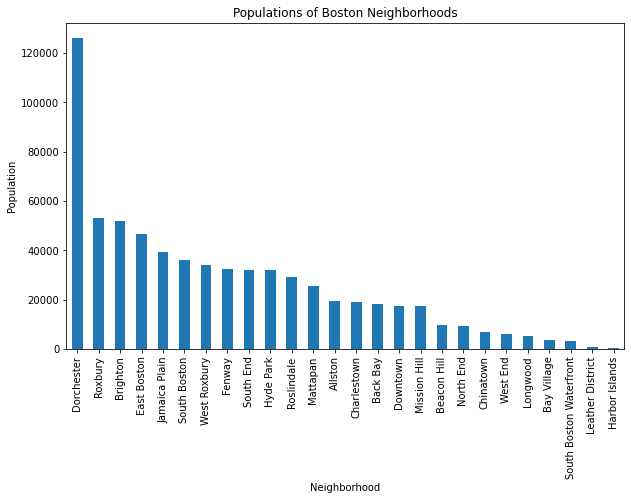

In [321]:
import matplotlib.pyplot as plt 

pop_df.plot(kind='bar', figsize=(10,6),label='Population')

plt.xlabel('Neighborhood')
plt.ylabel('Population')
plt.title('Populations of Boston Neighborhoods'
         )

plt.show()

fg. 5) Neighborhood Population Histogram

## Median Household Income Cholorpleth Map

In [50]:
boston_neighborhoods_df=pd.read_csv("boston_neighborhoods_df.csv")

In [36]:
bfc3_map = folium.Map(location=[latitude, longitude], zoom_start=13, control_scale=True) 

bfc3_map.choropleth(
       geo_data="Boston_Neighborhoods.geojson",
       data=boston_neighborhoods_df,
       columns=['Neighborhood','Median Household Income'],
       key_on='feature.properties.Name',
       fill_color='BuPu',
       fill_opacity='0.7',
       line_opacity='0.2',
       legend_name='Median Household Income in Boston, By Neighborhood')

for lat, lng, name in zip(fitness_center_df.lat, fitness_center_df.lng, fitness_center_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=4,
        color='red',
        fill = True,
        fill_color='red',
        fill_opacity=0.6
    ).add_to(bfc3_map)

for lat, lng, name in zip(fitness_studio_df.lat, fitness_studio_df.lng, fitness_studio_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        color='yellow',
        fill = True,
        fill_color='yellow',
        fill_opacity=0.4
    ).add_to(bfc3_map)

for lat, lng, name in zip(gym_df.lat, gym_df.lng, gym_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        color='green',
        fill = True,
        fill_color='green',
        fill_opacity=0.5
    ).add_to(bfc3_map)
    
for lat, lng, name in zip(crossfit_df.lat, crossfit_df.lng, crossfit_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        color='purple',
        fill = True,
        fill_color='purple',
        fill_opacity=0.4
    ).add_to(bfc3_map)
    
for lat, lng, name in zip(boxing_df.lat, boxing_df.lng, boxing_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        color='orange',
        fill = True,
        fill_color='orange',
        fill_opacity=0.4
    ).add_to(bfc3_map)
    
for lat, lng, name in zip(barre_df.lat, barre_df.lng, barre_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        color='pink',
        fill = True,
        fill_color='pink',
        fill_opacity=0.3
    ).add_to(bfc3_map)
    
for lat, lng, name in zip(rowing_df.lat, rowing_df.lng, rowing_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        color='brown',
        fill = True,
        fill_color='brown',
        fill_opacity=0.3
    ).add_to(bfc3_map)
    
for lat, lng, name in zip(yoga_df.lat, yoga_df.lng, yoga_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        color='white',
        fill = True,
        fill_color='white',
        fill_opacity=0.6
    ).add_to(bfc3_map)
    
for lat, lng, name in zip(ymca_df.lat, ymca_df.lng, ymca_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        color='teal',
        fill = True,
        fill_color='teal',
        fill_opacity=0.6
    ).add_to(bfc3_map)
    
for lat, lng, name in zip(cycle_df.lat, cycle_df.lng, cycle_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        color='black',
        fill = True,
        fill_color='black',
        fill_opacity=0.3
    ).add_to(bfc3_map)
    


# display map

bfc3_map


In [37]:
bfc3_map.save('neighborhood_hhincome_chloropleth_fitness.html')

- Red markers are fitness centers 
- Yellow markers are fitness studios 
- Green markers are gyms 
- Purple markers are CrossFit gyms
- Orange markers are boxing gyms/clubs
- Teal markersare YMCAs
- Brown markers are rowing 
- White markers are yoga studios 
- Pink markers are barre studios
- Black markers are cycle/spin studios

## Neighborhood Median Household Income Histogram

In [38]:
bn_df.sort_values(by=['Median Household Income'],axis=0, ascending=False, inplace=True)
bn_df

,Population,% of population 20-34 years,Median Household Income,Per Capita Income,% of population with a Bachelor's degree,Monthly rents for a one-bedroom apartment
Neighborhood,,,,,,
South Boston Waterfront,3443.0,48.1,150677.51,99072.76,82.0,3185.0
Charlestown,18901.0,30.4,103243.00,69219.23,63.5,2585.0
Back Bay,18176.0,41.3,102071.00,98494.96,85.0,2920.0
Bay Village,3660.0,41.3,102071.00,98494.96,85.0,2500.0
Beacon Hill,9751.0,48.8,98069.00,90227.22,89.8,2445.0
North End,9271.0,58.5,97110.39,81149.42,79.5,2350.0
West End,6173.0,42.4,96787.15,70388.97,73.6,3000.0
South Boston,36212.0,45.4,93077.60,55708.83,61.4,2840.0
South End,32040.0,36.2,86994.80,75387.48,65.8,2700.0


In [39]:
hhincome_df=bn_df['Median Household Income']
hhincome_df
#Set leather District = Chinatown= Downtown and no value for Harbor Islands 


Neighborhood
South Boston Waterfront    150677.51
Charlestown                103243.00
Back Bay                   102071.00
Bay Village                102071.00
Beacon Hill                 98069.00
North End                   97110.39
West End                    96787.15
South Boston                93077.60
South End                   86994.80
Jamaica Plain               84445.90
West Roxbury                80804.46
Roslindale                  76666.67
Hyde Park                   70810.13
Leather District            67367.00
Downtown                    67367.00
Chinatown                   67367.00
Brighton                    62041.00
East Boston                 52935.00
Dorchester                  49662.00
Mattapan                    48196.90
Allston                     46983.00
Fenway                      39550.00
Mission Hill                35707.32
Longwood                    35000.00
Roxbury                     27721.35
Harbor Islands                  5.00
Name: Median Household In

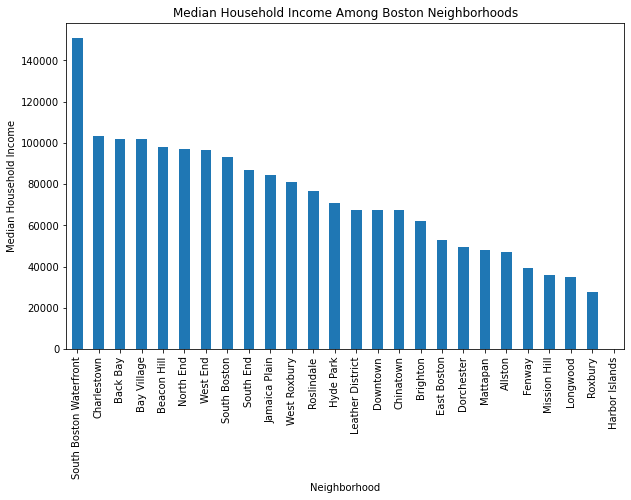

In [40]:
import matplotlib.pyplot as plt 

hhincome_df.plot(kind='bar', figsize=(10,6),label='Median Household Income')

plt.xlabel('Neighborhood')
plt.ylabel('Median Household Income')
plt.title('Median Household Income Among Boston Neighborhoods'
         )

plt.show()

fg. 6) Neighborhood Median Household Income 

# Percentage of Young Adult Population Choropleth Maps

In [42]:
bfc4_map = folium.Map(location=[latitude, longitude], zoom_start=13, control_scale=True) 

bfc4_map.choropleth(
       geo_data="Boston_Neighborhoods.geojson",
       data=boston_neighborhoods_df,
       columns=['Neighborhood','% of population 20-34 years '],
       key_on='feature.properties.Name',
       fill_color='YlGn',
       fill_opacity='0.7',
       line_opacity='0.2',
       legend_name='Percentage of Population 20-34 years old')


# adding the Fitness Centers as red circle marker
for lat, lng, name in zip(fitness_center_df.lat, fitness_center_df.lng, fitness_center_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=4,
        popup=name,
        color='red',
        fill = True,
        fill_color='red',
        fill_opacity=0.6
    ).add_to(bfc4_map)

for lat, lng, name in zip(fitness_studio_df.lat, fitness_studio_df.lng, fitness_studio_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=name,
        color='yellow',
        fill = True,
        fill_color='yellow',
        fill_opacity=0.4
    ).add_to(bfc4_map)

for lat, lng, name in zip(gym_df.lat, gym_df.lng, gym_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=name,
        color='green',
        fill = True,
        fill_color='green',
        fill_opacity=0.5
    ).add_to(bfc4_map)
    
for lat, lng, name in zip(crossfit_df.lat, crossfit_df.lng, crossfit_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=name,
        color='purple',
        fill = True,
        fill_color='purple',
        fill_opacity=0.4
    ).add_to(bfc4_map)
    
for lat, lng, name in zip(boxing_df.lat, boxing_df.lng, boxing_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=name,
        color='orange',
        fill = True,
        fill_color='orange',
        fill_opacity=0.4
    ).add_to(bfc4_map)
    
for lat, lng, name in zip(barre_df.lat, barre_df.lng, barre_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=name,
        color='pink',
        fill = True,
        fill_color='pink',
        fill_opacity=0.3
    ).add_to(bfc4_map)
    
for lat, lng, name in zip(rowing_df.lat, rowing_df.lng, rowing_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=name,
        color='brown',
        fill = True,
        fill_color='brown',
        fill_opacity=0.3
    ).add_to(bfc4_map)
    
for lat, lng, name in zip(yoga_df.lat, yoga_df.lng, yoga_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=name,
        color='white',
        fill = True,
        fill_color='white',
        fill_opacity=0.6
    ).add_to(bfc4_map)
    
for lat, lng, name in zip(ymca_df.lat, ymca_df.lng, ymca_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=name,
        color='teal',
        fill = True,
        fill_color='teal',
        fill_opacity=0.6
    ).add_to(bfc4_map)
    
for lat, lng, name in zip(cycle_df.lat, cycle_df.lng, cycle_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=name,
        color='black',
        fill = True,
        fill_color='black',
        fill_opacity=0.3
    ).add_to(bfc4_map)
    





bfc4_map


C:\Users\Scott\anaconda3\lib\site-packages\folium\folium.py:411: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(


fg.7) Percentage of population ages 20-34 years old.
*set Chinatown = Leather District = Downtown

- Red markers are fitness centers 
- Yellow markers are fitness studios 
- Green markers are gyms 
- Purple markers are CrossFit gyms
- Orange markers are boxing gyms/clubs
- Teal markersare YMCAs
- Brown markers are rowing 
- White markers are yoga studios 
- Pink markers are barre studios
- Black markers are cycle/spin studios

In [43]:
bfc4_map.save('young_adults_chloropleth_fitness.html')

## Young Adult Population Percentage Histogram

In [44]:
bn_df.sort_values(by=['% of population 20-34 years '],axis=0, ascending=False, inplace=True)
bn_df

,Population,% of population 20-34 years,Median Household Income,Per Capita Income,% of population with a Bachelor's degree,Monthly rents for a one-bedroom apartment
Neighborhood,,,,,,
Allston,19363.0,67.6,46983.00,28986.25,71.9,1900.0
North End,9271.0,58.5,97110.39,81149.42,79.5,2350.0
Brighton,51785.0,52.9,62041.00,35875.59,65.0,1950.0
Fenway,32598.0,52.4,39550.00,24997.27,74.5,2400.0
Beacon Hill,9751.0,48.8,98069.00,90227.22,89.8,2445.0
South Boston Waterfront,3443.0,48.1,150677.51,99072.76,82.0,3185.0
Mission Hill,17406.0,48.1,35707.32,21385.84,48.5,2100.0
Longwood,5389.0,46.5,35000.00,7033.23,73.8,2325.0
South Boston,36212.0,45.4,93077.60,55708.83,61.4,2840.0


In [45]:
young_adults_df=bn_df['% of population 20-34 years ']
young_adults_df
#Set China town=leather district = downtown

Neighborhood
Allston                    67.6
North End                  58.5
Brighton                   52.9
Fenway                     52.4
Beacon Hill                48.8
South Boston Waterfront    48.1
Mission Hill               48.1
Longwood                   46.5
South Boston               45.4
West End                   42.4
Back Bay                   41.3
Bay Village                41.3
South End                  36.2
Chinatown                  34.6
Leather District           34.6
Downtown                   33.5
Jamaica Plain              33.0
Charlestown                30.4
East Boston                29.3
Dorchester                 28.0
Roxbury                    26.2
Mattapan                   21.5
Roslindale                 21.1
Hyde Park                  20.8
West Roxbury               17.2
Harbor Islands              7.5
Name: % of population 20-34 years , dtype: float64

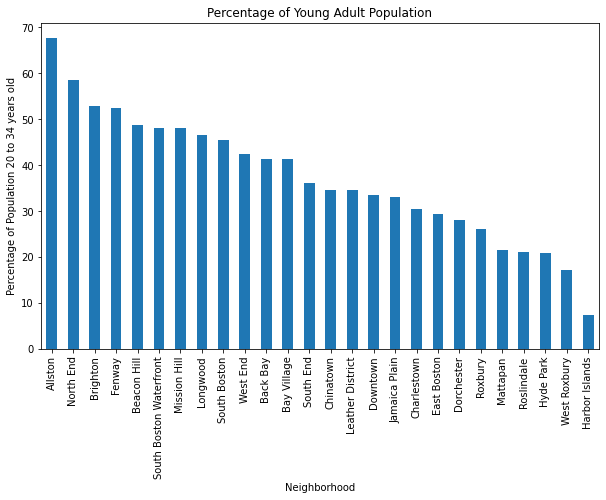

In [46]:
young_adults_df.plot(kind='bar', figsize=(10,6),label='% of population 20-34 years')

plt.xlabel('Neighborhood')
plt.ylabel('Percentage of Population 20 to 34 years old')
plt.title('Percentage of Young Adult Population'
         )

plt.show()

fg. 8) Percentage of Population 20 to 34 Years Old Historgram

### Percentage of Population with a Bachelor's Degree Choropleth Map 

In [52]:
bfc5_map = folium.Map(location=[latitude, longitude], zoom_start=13, control_scale=True) 

bfc5_map.choropleth(
       geo_data="Boston_Neighborhoods.geojson",
       data=boston_neighborhoods_df,
       columns=['Neighborhood','% of population with a Bachelors degree'],
       key_on='feature.properties.Name',
       fill_color='YlOrBr',
       fill_opacity='0.7',
       line_opacity='0.2',
       legend_name='Percentage of Population with Bachelors Degree')


# adding the Fitness Centers as red circle marker
for lat, lng, name in zip(fitness_center_df.lat, fitness_center_df.lng, fitness_center_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=4,
        popup=name,
        color='red',
        fill = True,
        fill_color='red',
        fill_opacity=0.6
    ).add_to(bfc5_map)

for lat, lng, name in zip(fitness_studio_df.lat, fitness_studio_df.lng, fitness_studio_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=name,
        color='yellow',
        fill = True,
        fill_color='yellow',
        fill_opacity=0.4
    ).add_to(bfc5_map)

for lat, lng, name in zip(gym_df.lat, gym_df.lng, gym_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=name,
        color='green',
        fill = True,
        fill_color='green',
        fill_opacity=0.5
    ).add_to(bfc5_map)
    
for lat, lng, name in zip(crossfit_df.lat, crossfit_df.lng, crossfit_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=name,
        color='purple',
        fill = True,
        fill_color='purple',
        fill_opacity=0.4
    ).add_to(bfc5_map)
    
for lat, lng, name in zip(boxing_df.lat, boxing_df.lng, boxing_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=name,
        color='orange',
        fill = True,
        fill_color='orange',
        fill_opacity=0.4
    ).add_to(bfc5_map)
    
for lat, lng, name in zip(barre_df.lat, barre_df.lng, barre_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=name,
        color='pink',
        fill = True,
        fill_color='pink',
        fill_opacity=0.3
    ).add_to(bfc5_map)
    
for lat, lng, name in zip(rowing_df.lat, rowing_df.lng, rowing_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=name,
        color='brown',
        fill = True,
        fill_color='brown',
        fill_opacity=0.3
    ).add_to(bfc5_map)
    
for lat, lng, name in zip(yoga_df.lat, yoga_df.lng, yoga_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=name,
        color='white',
        fill = True,
        fill_color='white',
        fill_opacity=0.6
    ).add_to(bfc5_map)
    
for lat, lng, name in zip(ymca_df.lat, ymca_df.lng, ymca_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=name,
        color='teal',
        fill = True,
        fill_color='teal',
        fill_opacity=0.6
    ).add_to(bfc5_map)
    
for lat, lng, name in zip(cycle_df.lat, cycle_df.lng, cycle_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=name,
        color='black',
        fill = True,
        fill_color='black',
        fill_opacity=0.3
    ).add_to(bfc5_map)
    





bfc5_map


fg.9) Per Capita by Neighborhood in Boston 

In [53]:
bfc5_map.save('Boston_Bachelors_Degree.html')

In [ ]:
#set Chinatown= Leather district = Downtown

- Red markers are fitness centers 
- Yellow markers are fitness studios 
- Green markers are gyms 
- Purple markers are CrossFit gyms
- Orange markers are boxing gyms/clubs
- Teal markersare YMCAs
- Brown markers are rowing 
- white markers are yoga studios 
- Pink markers are barre studios
- Black markers are cycle/spin studios

## Historgram of Percent of Population with a Bachelor's Degree in Boston Neighborhoods

In [58]:
bn_df.sort_values(by=['% of population with a Bachelors degree'], axis=0, ascending=False, inplace=True)
bn_df

KeyError: '% of population with a Bachelors degree'

In [56]:
pci_df=bn_df['Per Capita Income']
pci_df

Neighborhood
South Boston Waterfront    99072.76
Bay Village                98494.96
Back Bay                   98494.96
Beacon Hill                90227.22
North End                  81149.42
South End                  75387.48
West End                   70388.97
Charlestown                69219.23
Chinatown                  67994.13
Downtown                   67994.13
Leather District           67994.13
South Boston               55708.83
Jamaica Plain              46720.95
West Roxbury               43415.27
Roslindale                 38760.19
Brighton                   35875.59
Hyde Park                  31570.24
Allston                    28986.25
East Boston                26569.00
Dorchester                 26291.58
Fenway                     24997.27
Mattapan                   23728.70
Mission Hill               21385.84
Roxbury                    18931.82
Harbor Islands              7823.91
Longwood                    7033.23
Name: Per Capita Income, dtype: float64

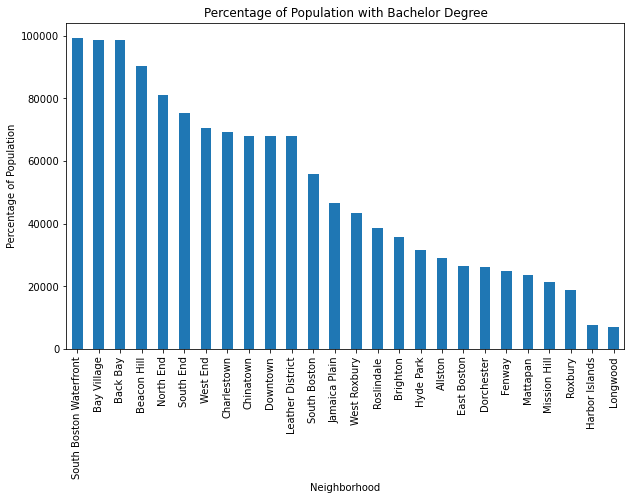

In [60]:
pci_df.plot(kind='bar', figsize=(10,6),label='% of population with a Bachelors degree')

plt.xlabel('Neighborhood')
plt.ylabel('Percentage of Population')
plt.title('Percentage of Population with Bachelor Degree'
         )

plt.show()

fg. 10) Percentage of Population with Bachelor Degree by Boston Neighborhood

In [63]:
bfc6_map = folium.Map(location=[latitude, longitude], zoom_start=13, control_scale=True) 

bfc6_map.choropleth(
       geo_data="Boston_Neighborhoods.geojson",
       data=boston_neighborhoods_df,
       columns=['Neighborhood','Monthly rents for a one-bedroom apartment'],
       key_on='feature.properties.Name',
       fill_color='YlGn',
       fill_opacity='0.7',
       line_opacity='0.2',
       legend_name="Percentage of Population With a Bachelor's Degree")


# adding the Fitness Centers as red circle marker
for lat, lng, name in zip(fitness_center_df.lat, fitness_center_df.lng, fitness_center_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=4,
        popup=name,
        color='red',
        fill = True,
        fill_color='red',
        fill_opacity=0.6
    ).add_to(bfc6_map)

for lat, lng, name in zip(fitness_studio_df.lat, fitness_studio_df.lng, fitness_studio_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=name,
        color='yellow',
        fill = True,
        fill_color='yellow',
        fill_opacity=0.4
    ).add_to(bfc6_map)

for lat, lng, name in zip(gym_df.lat, gym_df.lng, gym_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=name,
        color='green',
        fill = True,
        fill_color='green',
        fill_opacity=0.5
    ).add_to(bfc6_map)
    
for lat, lng, name in zip(crossfit_df.lat, crossfit_df.lng, crossfit_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=name,
        color='purple',
        fill = True,
        fill_color='purple',
        fill_opacity=0.4
    ).add_to(bfc6_map)
    
for lat, lng, name in zip(boxing_df.lat, boxing_df.lng, boxing_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=name,
        color='orange',
        fill = True,
        fill_color='orange',
        fill_opacity=0.4
    ).add_to(bfc6_map)
    
for lat, lng, name in zip(barre_df.lat, barre_df.lng, barre_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=name,
        color='pink',
        fill = True,
        fill_color='pink',
        fill_opacity=0.3
    ).add_to(bfc6_map)
    
for lat, lng, name in zip(rowing_df.lat, rowing_df.lng, rowing_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=name,
        color='brown',
        fill = True,
        fill_color='brown',
        fill_opacity=0.3
    ).add_to(bfc6_map)
    
for lat, lng, name in zip(yoga_df.lat, yoga_df.lng, yoga_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=name,
        color='white',
        fill = True,
        fill_color='white',
        fill_opacity=0.6
    ).add_to(bfc6_map)
    
for lat, lng, name in zip(ymca_df.lat, ymca_df.lng, ymca_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=name,
        color='teal',
        fill = True,
        fill_color='teal',
        fill_opacity=0.6
    ).add_to(bfc6_map)
    
for lat, lng, name in zip(cycle_df.lat, cycle_df.lng, cycle_df.name):
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=name,
        color='black',
        fill = True,
        fill_color='black',
        fill_opacity=0.3
    ).add_to(bfc6_map)
    





bfc6_map


fg.11) Median Monthly Rent by Neighborhood

In [64]:
bfc6_map.save('rent_ in_BOS.html')

## Histogram of Rent in Boston Neighborhoods

In [65]:
bn_df.sort_values(['Monthly rents for a one-bedroom apartment'], axis=0, ascending=False, inplace=True)

In [66]:
rent_df=bn_df['Monthly rents for a one-bedroom apartment']

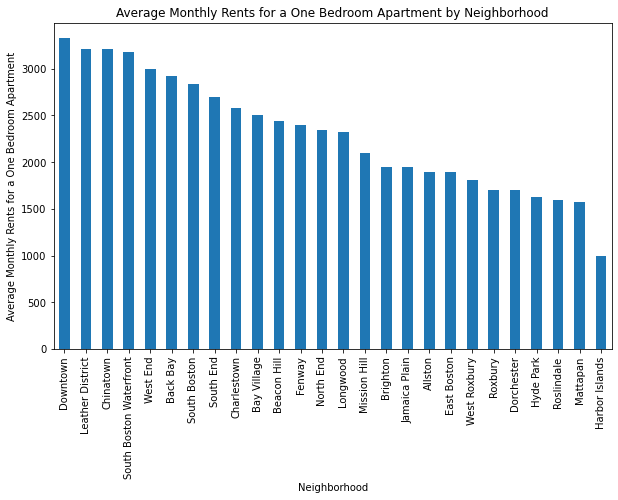

In [67]:
rent_df.plot(kind='bar', figsize=(10,6),label='Monthly Rent')

plt.xlabel('Neighborhood')
plt.ylabel('Average Monthly Rents for a One Bedroom Apartment')
plt.title('Average Monthly Rents for a One Bedroom Apartment by Neighborhood')

plt.show()

fg.12) Monthly rents for a one bedroom apartment by neighborhood

# Results

Dorchester is by far the largest neighborhood, has a high young adult population and low rent and there are not any fitness centers in North Dorchester, however, it has a low median household income, along with Mattapan, Mission Hill, Longwood, Fenway, East Boston, and Allston. 
Downtown (including Chinatown and the Leather District) has the highest rent and already has plenty of fitness venues. Back Bay and Bay Village are also expensive and have plenty of fitness venues.

Jamaica Plain and Beacon Hill look like the best places to open a fitness venue according to these maps.  Both have a high percentage of population with a Bachelor's degree and both have few fitness venues in the area.  Jamaica Plain has a higher population and lower rent while Beacon Hill has the highest percentage of population with a bachelor's degree and a large young adult population.

# Discussion

This project shows a good overview of the fitness club industry in the area by demonstrating the demographics and markers for all the fitness venues.  However, it is far from being the reason to open a gym in the area. 

Boston is a very developed city, there may be a reason there are fitness venues in Beacon Hill. Google maps could also be missing fitness venues or my data needs to be updates.  

Also as a result of COVID-19, many fitness center venues have shutdown and people are starting to turn to home workouts and exercise so this project may not be useful until peope are returning to the gym.

I think this project would be a lot more useful if I could be more exact.  If I could find a specific block or even property that would be ideal for opening a fitness venue, that would make this project this much better.  Dividing the city up by postal code could be an option but then I would need to find data for postal codes.

## Conclusion

Although I was able to locate what looks like a couple good neighborhoods to open a fitness venue, I feel that this project needs more data.  There is not a lot of research or studies open to the public done on gym attendance and membership, but the IHRSA was helpful. I cannot be entirely sure if opening a gym in Beacon Hill would be a good financial decision either.  Furthermore, I would have to look at the "For Sale" properties in the areas to determine where the very best locations would be. Nonetheless, this project provides a good overview of Boston's fitness club industry and would be helpful for someone interested on the topic.  It could be even more useful with more knowledge of the fitness industry and individual fitness venues.